# Nonlinear Migdal-Eliashberg theory

Set up multi-processing and include all relevant packages; These packages must be downloaded first:

import Pkg;     Pkg.add("Packagename")

In [ ]:
import Pkg
Pkg.add("Distributed")

Multiprocessing can be turned off by the if-loop not being satisfied

In [1]:
using Distributed

if nprocs() < 2
    addprocs(9)
end

@everywhere using LinearAlgebra, Plots, LaTeXStrings, QuadGK, JLD2, SharedArrays

Load all relevant data which can be downloaded from GitHub (also run the cell below with all relevant parameters). This data can generate all figures of the manuscript.

In [5]:
Im_sol = load_object("Im_sol");     Im_sol_λ = load_object("Im_sol_lambda");
Re_sol = load_object("Re_sol_c");     Re_sol_λ = load_object("Re_sol_lambda_c");
Tcplot = load_object("T_c");
Tctot = [load_object("Tcs"); load_object("Tchigh")];
Re_sol_low = load_object("Resol0");
Re_sol_high = load_object("Re_sol_0_high");

Define relevant parameters for the model (F is a list for varying $\lambda_1$)

In [6]:
@everywhere function nB(ω,T)
    return 1/(exp(ω/(kB*T))-1)
end
u = 0.12
ωc = 0.28
ω₀ = 10e-3
λ₀ = 1
λ₁ = 0.2
ϵ = ω₀/10
ωcrit = (4/5)*ω₀
kB = 8.617333e-5
F = 0:0.02:0.2;     FL = length(F)
Tlist = [0.1 0.5 0.6 0.7 0.8 0.85 0.9 0.95 0.98 0.99];  L = length(Tlist);
λplot = 0:0.005:1;      S = 0:0.02:0.2;
zmin = ω₀-ωcrit;    zmax = 2ω₀+ωcrit

Colorscheme = :batlow
lc = palette(cgrad(Colorscheme, L+1, categorical=true))[1:L]';
lcF = palette(cgrad(Colorscheme, FL+1, categorical=true))[1:FL]';

The Eliashberg function $\alpha^2F(\nu)$

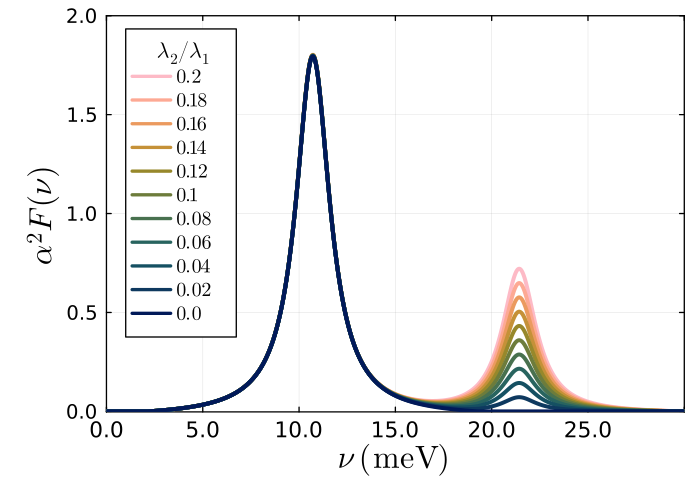

In [7]:
zplotmin = 0;       zplotmax = zmax
@everywhere function α²F(z, ω₀, λ₀, λ₁, ϵ, ωcrit, zmin, zmax)
    function normalise(z, ω₀, λ₀, λ₁, ϵ, ωcrit)
        return (λ₀*ω₀/(2π))*(ϵ / ((z - ω₀)^2 + ϵ^2) - ϵ / (ωcrit^2 + ϵ^2)) * (ωcrit - abs(z - ω₀) > 0) + (λ₁*ω₀/(π))*(ϵ / ((z - 2ω₀)^2 + ϵ^2) - ϵ / (ωcrit^2 + ϵ^2)) * (ωcrit - abs(z - 2ω₀) > 0)
    end
    return ((λ₀+λ₁)/quadgk(x-> 2normalise(x, ω₀, λ₀, λ₁, ϵ, ωcrit)/x, zmin, zmax, rtol=1e-3, segbuf = alloc_segbuf(Float64, Float64, Float64))[1]).*normalise.(z, ω₀, λ₀, λ₁, ϵ, ωcrit)
end

z = LinRange(0,zmax, 1000)

plot(); xnames = 0:round(1000ω₀/2):999zplotmax

for i ∈ FL:-1:1

    plot!(z, α²F(z, ω₀, λ₀, F[i], ϵ, ωcrit, zplotmin, zplotmax), xlims = (zplotmin,zmax), xticks = (0:zplotmax/6:2zplotmax, xnames), xtickfontsize = 11, ylims = (-0.0025, ceil(maximum(α²F(z, ω₀, λ₀, F[i], ϵ, ωcrit, zplotmin, zplotmax)))), yticks = 0:0.5:25, ytickfontsize = 10, c = lcF[i], 
        lw = 3, gridopacity = 0.05, legend = false, label = false, xlabel = L"\nu\;(\textrm{meV})", ylabel = L"\alpha^2F(\nu)", xlabelfontsize = 16, ylabelfontsize = 16, size = (700,500), thickness_scaling = 1.33, fillrange=0, fillalpha=0, framestyle = :box
    )

end

ghost = ones(length(F))';   plot!(ghost, ghost, label = [L"%$j" for j=reverse((F[1:end]))'], lw = 2, c=reverse(lcF), legendtitle=L"\lambda_2/\lambda_1", legendfontsize=10, legendtitlefontsize=11, legendposition = :topleft)

plot!()

## $\textbf{The following blocks of code are used to generate new data!}$

Critical temperature $T_c$

In [9]:
include("T_crit.jl")

Tc = T_crit(α²F, u, ωc, 1e-10, ω₀, λ₀, λ₁, ϵ, ωcrit, zmin, zmax)

12.26509149027828

Critical temperature for different values of $\lambda$

In [ ]:
@everywhere include("T_crit.jl")

λplot = 1e-10:0.005:1;     S = 0:0.02:0.2
Tcplot = SharedArray(zeros(length(λplot),length(S)));   i = SharedArray(zeros(1))

@sync @distributed for i ∈ 1:length(S)
    s = S[i];    j = 0
    for j ∈ 1:length(λplot)     
        λ0 = λplot[j];     λ1 = s*λ0
        Tcplot[j,i] = T_crit(α²F, u, ωc, 1e-3, ω₀, λ0, λ1, ϵ, ωcrit, zplotmin, zplotmax)
    end
end

save_object("T_c", Tcplot)

Superconducting band gap $\Delta(i\omega_m)$ for different temperatures $T$

In [ ]:
@everywhere include("Im_bandgap.jl")

N = Int64(round(ωc/(2π*kB*minimum(Tlist)*Tc)-1/2));     
Im_sol = SharedArray(zeros(2N, 2, L))

@sync @distributed for i ∈ 1:L

    t = Tlist[i]*Tc;     M = Int64(round(ωc/(2π*kB*t)-1/2))

    λ₁T = λ₁*(1+2nB(ω₀,t))

    @views Im_sol[1:2M,:,i] .= ImΔₘ(α²F, u, ωc, ω₀, λ₀, λ₁T, ϵ, ωcrit, t, 5000, zmin, zmax)

end

save_object("Im_sol",Im_sol)

Superconducting band gap $\Delta(i\omega_m)$ for different nonlinearity $\lambda_2$

In [ ]:
@everywhere include("Im_bandgap.jl"), include("T_crit.jl")

T = 3;  N = Int64(round(ωc/(2π*kB*T)-1/2));
Im_sol_λ = SharedArray(zeros(2N, 2, FL))

@sync @distributed for i ∈ 1:FL

    λ1 = F[i]*λ₀*(1+2nB(ω₀,T));

    @views Im_sol_λ[:,:,i] .= ImΔₘ(α²F, u, ωc, ω₀, λ₀, λ1, ϵ, ωcrit, T, 10000, zmin, zmax)

end

save_object("Im_sol_lambda",Im_sol_λ)

Superconducting gap function $\Delta(\omega+i\delta)$ for different temperatures $T$

In [ ]:
@everywhere include("Re_bandgap.jl")

Nω = 20000;  maxω = 0.5

Δₘ = Im_sol[:,1,:]
kₘ = Im_sol[:,2,:]

Re_sol = SharedArray(zeros(ComplexF64, 2Nω, 4, L))

@sync @distributed for i ∈ 1:L
 
    T = Tlist[i]*Tc;    maxiter = Int64(round(9sqrt(T)))

    λ₁T = λ₁*(1+2nB(ω₀,t))

    ωₘ = deleteat!(kₘ[:,i], kₘ[:,i].==0);        ImΔ = deleteat!(Δₘ[:,i], Δₘ[:,i].==0)

    @views Re_sol[:,:,i] .= ReΔ_f(α²F, u, ωc, ω₀, λ₀, λ₁T, ϵ, ωcrit, T, maxiter, Nω, 0.09, maxω, ωₘ, ImΔ, kB, zmin, zmax)

end

save_object("Re_sol",Re_sol)
save_object("Re_sol_c",Re_sol[1:20:end]) #Compress data file (good convergence only seems to be achieved with high amount of data points, but these are too many points for plotting)

Superconducting gap function $\Delta(\omega+i\delta)$ for different nonlinearity $\lambda_2$

In [ ]:
@everywhere include("Re_bandgap.jl")
@everywhere include("Re_bandgap_fast.jl")

Nω = 30000;  maxω = 0.5

Δₘ = Im_sol_λ[:,1,:]
kₘ = Im_sol_λ[:,2,:]

Re_sol_λ = SharedArray(zeros(ComplexF64, 2Nω, 4, FL))

T = 3

@sync @distributed for i ∈ 1:FL

    λ₁ = F[i]*λ₀*(1+2nB(ω₀,T))
    maxiter = 10
    ωₘ = kₘ[:,i];    ImΔ = Δₘ[:,i]

    @views Re_sol_λ[:,:,i] .= ReΔ_f(α²F, u, ωc, ω₀, λ₀, λ₁, ϵ, ωcrit, T, maxiter, Nω, 0.09, maxω, ωₘ, ImΔ, kB, zmin, zmax)

end

save_object("Re_sol_lambda",Re_sol_λ)
save_object("Re_sol_lambda_c",Re_sol_λ[1:30:end]) #Compress data file (good convergence only seems to be achieved with high amount of data points, but these are too many points for plotting)

Calculates the gap function using a faster algorithm for different $\lambda_1$ and $\lambda_2$, this gap function is only correct near 0 meV input, and can be used to find the fixed point of the real part $\Delta_0=\Re\Delta(\Delta_0)$

In [ ]:
@everywhere include("Im_bandgap.jl"), include("T_crit.jl"), include("Re_bandgap_0K.jl"), include("Re_bandgap_fast.jl")

dλ = 0.1

λ1 = 0.24+dλ:dλ:3.2;     L1 = length(λ1)
λ2 = 0:0.02:0.2;        L2 = length(λ2)

ωc0K = ωc
Tfit = 0.2*ones(L1)

T = minimum(Tfit);  N = Int64(round(ωc0K/(2π*kB*T)-1/2));
Nω = 2500;  maxω = 0.2
Imsol = SharedArray(zeros(2N, 2, L1, L2))
Re_sol_λ_0 = SharedArray(zeros(ComplexF64, 2Nω, 4, L1, L2))

@sync @distributed for i ∈ 1:L1
    n = Int64(round(ωc0K/(2π*kB*Tfit[i])-1/2))
    for j ∈ 1:L2
        @views Imsol[1:2n,:,i,j] .= ImΔₘ(α²F, u, ωc0K, ω₀, λ1[i], λ1[i]*λ2[j], ϵ, ωcrit, Tfit[i], 1000, zmin, zmax)
    end
end

println("Imaginary gap calculated")

Δₘ = Imsol[:,1,:,:]
kₘ = Imsol[:,2,:,:]

@sync @distributed for i ∈ 1:L1
    n = Int64(round(ωc0K/(2π*kB*Tfit[i])-1/2))
    for j ∈ 1:L2
        ωₘ = kₘ[1:2n,i,j];    ImΔ = Δₘ[1:2n,i,j]
        #@views Re_sol_λ_0[:,:,i,j] .= ReΔ_f(α²F, u, ωc0K, ω₀, λ1[i], λ1[i]*λ2[j], ϵ, ωcrit, Tfit[i], 5, Nω, 0.09, maxω, ωₘ, ImΔ, kB, zmin, zmax)
        @views Re_sol_λ_0[:,:,i,j] .= ReΔ_0(α²F, u, ωc0K, ω₀, λ1[i], λ1[i]*λ2[j], ϵ, ωcrit, Nω, 0.09, maxω, ωₘ, ImΔ, kB, zmin, zmax, Tfit[i])   #faster convergence, since at T=0 we do not have to perform the additional integrations over the real axis
    end
end

## $\textbf{The following blocks of code are used to generate only figures, these can be displayed with the preloaded data as well.}$

### Figures

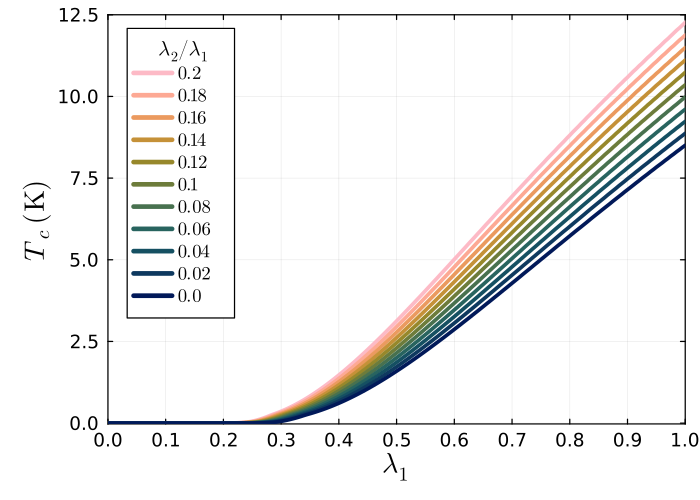

In [8]:
using Plots

plot(λplot, reverse(Tcplot, dims=2), label=[L"%$j" for j = reverse(S[1:end])'],
    legendtitle=L"\lambda_2/\lambda_1", legendfontsize=10, legendtitlefontsize=11, legendtitlehalign=:left, legendfonthalign=:left, legendposition = :topleft, c = reverse(lcF), 
    xlims = (0,1), ylims = (-0.025,12.5), xticks = 0:0.1:10, yticks = 0:2.5:25, xlabel=L"\lambda_1", ylabel=L"T_c\;(\textrm{K})", 
    xtickfontsize = 10, ytickfontsize = 10, lw = 3, xlabelfontsize = 15, ylabelfontsize = 15, gridopacity = 0.05,
    size = (700,500), thickness_scaling = 1.25, framestyle = :box
)

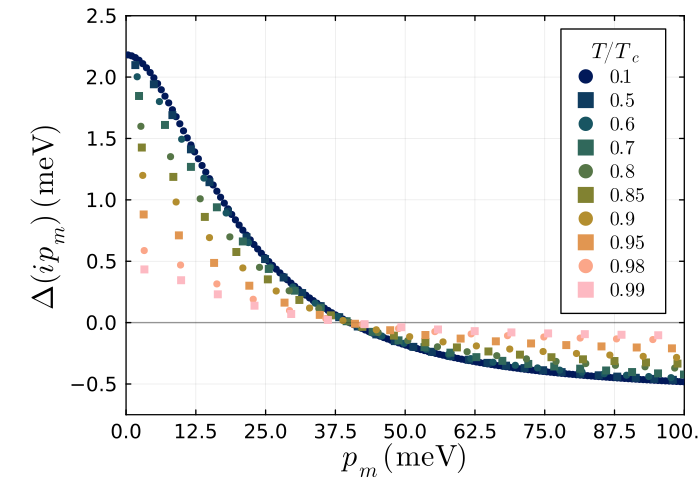

In [9]:
Δₘ = Im_sol[:,1,:]
m = [:circle, :rect]

plot()

for i ∈ 1:L

    T = Tlist[i]

    ωₘ = deleteat!(Im_sol[:,2,i], Im_sol[:,2,i].==0);   zero = zeros(length(ωₘ))

    plot!(1000ωₘ, zero, label = false; c = :black, lw = 1, linealpha = 0.05)

    scatter!(1000ωₘ, 1000Δₘ[:,i], label=L"%$T", shape = m[mod(i+1,2)+1],
        legendtitle=L"T/T_c", legendfontsize=10, legendtitlefontsize=11, legendtitlehalign=:left, legendfonthalign=:left,
        c=lc[i], ms=3, xlabel=L"p_m\:(\textrm{meV})", ylabel=L"\Delta(ip_m)\;(\textrm{meV})", xlims=(0,100), ylims=(-0.75,2.5),
        xticks=-1000:12.5:1000, yticks=-2.5:0.5:5, msw=0,size=(700,500), thickness_scaling = 1.33, framestyle = :box, gridopacity = 0.05,
        xlabelfontsize = 15, ylabelfontsize = 15, xtickfontsize = 10, ytickfontsize = 10
    )

end

plot!()

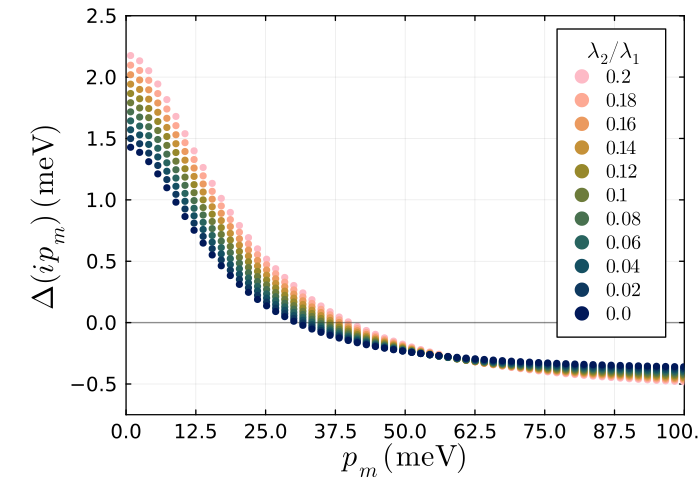

In [10]:
m = [:circle]

plot()

for i ∈ 1:FL

    T = F[FL+1-i]

    ωₘ = Im_sol_λ[:,2,FL+1-i];   
    Δₘ = Im_sol_λ[:,1,FL+1-i]
    
    ωplot = deleteat!(ωₘ, ωₘ .== 0)
    zero = zeros(length(ωplot))
    Δplot = deleteat!(Δₘ, Δₘ .== 0)

    plot!(1000ωplot, zero, label = false; c = :black, lw = 1, linealpha = 0.05)

    scatter!(1000ωplot, 1000Δplot, label=L"%$T", shape = :circle,
        legendtitle=L"\lambda_2/\lambda_1", legendfontsize=10, legendtitlefontsize=11, legendtitlehalign=:left, legendfonthalign=:left,
        c=lcF[FL+1-i], ms=3, xlabel=L"p_m\:(\textrm{meV})", ylabel=L"\Delta(ip_m)\;(\textrm{meV})", xlims=(0,100), ylims=(-0.75,2.5),
        xticks=-1000:12.5:1000, yticks=-2.5:0.5:5, msw=0,size=(700,500), thickness_scaling = 1.33, framestyle = :box, gridopacity = 0.05,
        xlabelfontsize = 15, ylabelfontsize = 15, xtickfontsize = 10, ytickfontsize = 10
    )

end

plot!()

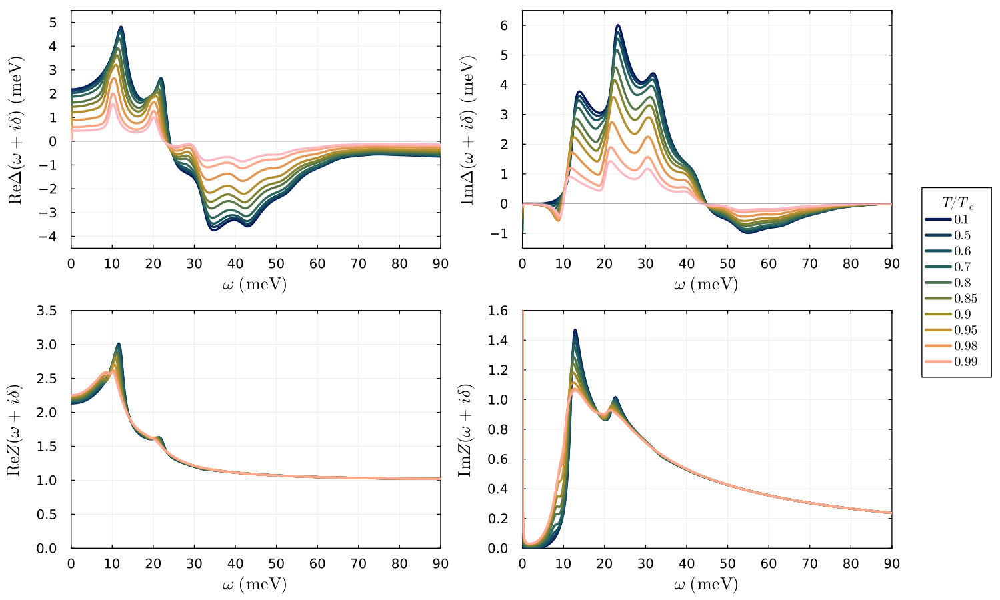

In [11]:
Re_Δ = Re_sol[:,1,:];           scale = 1
Re_Z = Re_sol[:,3,:]

symm = 0;       lims = 90

ω = real.(Re_sol[1:scale:end,4,1]);   zero = zeros(length(ω))
Δ = Re_Δ[1:scale:end,:];      Z = Re_Z[1:scale:end,:];  C = lcF

Xlabel = L"\omega\:\:(\textrm{meV})"
Ylabel = [L"\textrm{Re}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Im}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Re}Z(\omega+i\delta)" L"\textrm{Im}Z(\omega+i\delta)"]

p1 = plot(1000ω, 1000real.(Δ), label = false, c = lc, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-4.5,5.5), xlabel = Xlabel, ylabel = Ylabel[1], yticks = -10:10)
p2 = plot(1000ω, 1000imag.(Δ), label = false, c = lc, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.5,6.5), xlabel = Xlabel, ylabel = Ylabel[2], yticks = -10:10)
p3 = plot(1000ω, real.(Z), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,3.5), xlabel = Xlabel, ylabel = Ylabel[3], yticks = -10:0.5:10)
p4 = plot(1000ω, imag.(Z), label = [L"%$j" for j = Tlist[1:end]'], c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.6symm,1.6), xlabel = Xlabel, ylabel = Ylabel[4], yticks = -10:0.2:10, legendtitle = L"T/T_c", legendfontsize = 10)
pempty = plot(0, 0, xaxis = false, yaxis = false, grid = false)

plot(p1, p2, p3, p4, pempty, pempty, thickness_scaling=1.33, size = (1500,900), xticks = -1000:10:1000, legend = (1.17,1.45),
    lw = 2.5, gridopacity = 0.05, xlabelfontsize = 13, ylabelfontsize = 13, xtickfontsize = 10, ytickfontsize = 10, layout= @layout [ [grid(2,2)]  grid(10,1){0.04w}]
)

plot!([1000ω, 1000ω], [zero, zero], label = false, c=:black, lw = 1, linealpha = 0.25)

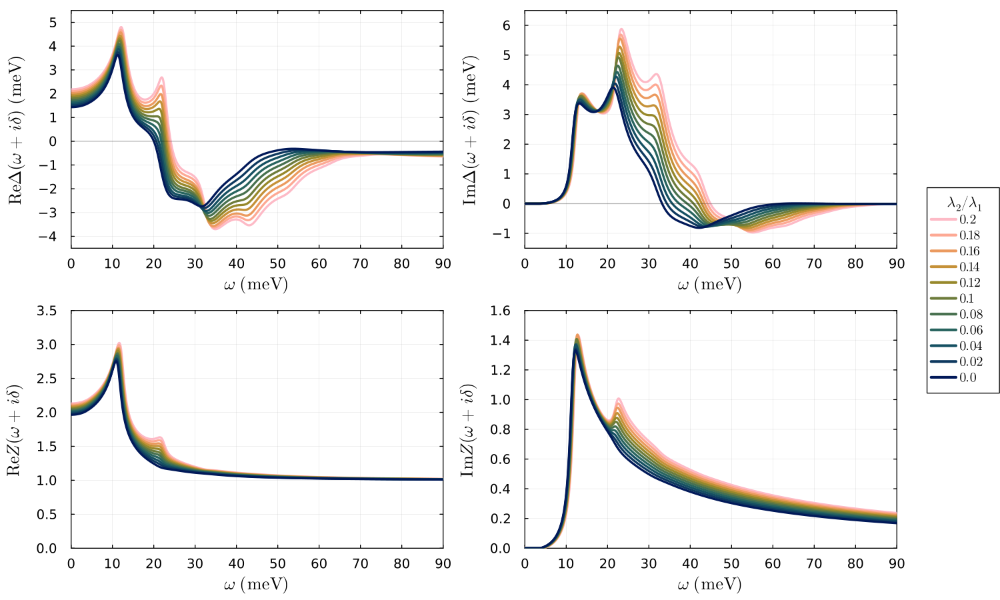

In [12]:
Re_Δ = Re_sol_λ[:,1,:];         scale = 1
Re_Z = Re_sol_λ[:,3,:]

symm = 0;       lims = 90

ω = real.(Re_sol_λ[1:scale:end,4,1]);         zero = zeros(length(ω))
Δ = reverse(Re_Δ[1:scale:end,:],dims=2);      Z = reverse(Re_Z[1:scale:end,:],dims=2);  C = reverse(lcF)

Xlabel = L"\omega\:\:(\textrm{meV})"
Ylabel = [L"\textrm{Re}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Im}\Delta(\omega+i\delta)\:\:(\textrm{meV})" L"\textrm{Re}Z(\omega+i\delta)" L"\textrm{Im}Z(\omega+i\delta)" L"|\Delta(\omega+i\delta)|\;(\textrm{meV})" L"\textrm{Arg}[\Delta(\omega+i\delta)]"]
ynames = [L"0" L"\frac{\pi}{2}" L"\pi" L"\frac{3\pi}{2}" L"2\pi"]

p1 = plot(1000ω, 1000real.(Δ), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-4.5,5.5), xlabel = Xlabel, ylabel = Ylabel[1], yticks = -10:10, ytickfontsize = 10)
p2 = plot(1000ω, 1000imag.(Δ), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.5,6.5), xlabel = Xlabel, ylabel = Ylabel[2], yticks = -10:10, ytickfontsize = 10)
p3 = plot(1000ω, real.(Z), label = false, c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,3.5), xlabel = Xlabel, ylabel = Ylabel[3], yticks = -10:0.5:10, ytickfontsize = 10)
p4 = plot(1000ω, imag.(Z), label = [L"%$j" for j = F[end:-1:1]'], c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (-1.6symm,1.6), xlabel = Xlabel, ylabel = Ylabel[4], yticks = -10:0.2:10, 
        legendtitle = L"\lambda_2/\lambda_1", legendfontsize = 10, ytickfontsize = 10)
pempty = plot(0, 0, xaxis = false, yaxis = false, grid = false)
p5 = plot(1000ω, 1000sqrt.(abs2.(Δ)), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,6.5), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = Ylabel[5], yticks = -10:10, lw = 2.5, label = false, ytickfontsize = 10)
p6 = plot(1000ω, mod.(angle.(Δ.+im*1e-5),2π), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,2π), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = Ylabel[6] , yticks = (0:π/2:2π, ynames), lw = 2.5, label = false, ytickfontsize = 12)

plot(p1, p2, p3, p4, pempty, pempty, thickness_scaling=1.33, size = (1500,900), xticks = -1000:10:1000, legend = (1.17,1.45),
    lw = 2.5, gridopacity = 0.05, xlabelfontsize = 13, ylabelfontsize = 13, xtickfontsize = 10, layout = @layout [ [grid(2,2)]  grid(10,1){0.04w}]
)

plot!([1000ω, 1000ω], [zero, zero], label = false, c=:black, lw = 1, linealpha = 0.25)

#savefig("C:/Uni/Papers/Ingvar/Real_solutions_lambda.svg");  savefig("Real_solutions_lambda.svg")

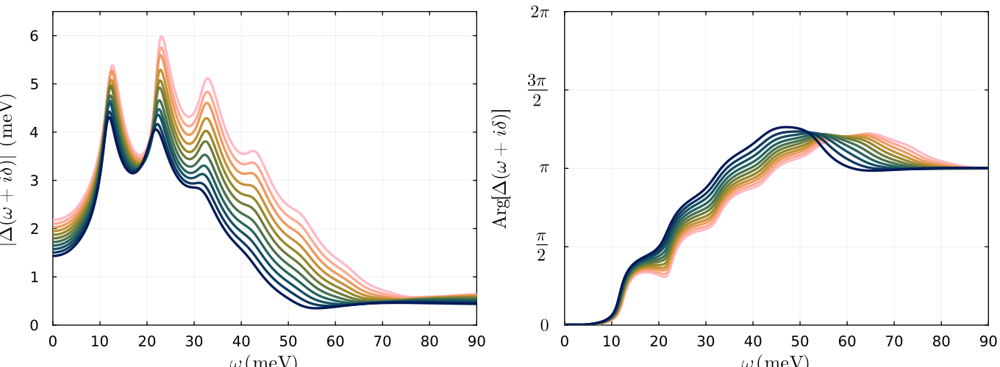

In [13]:
Re_Δ = Re_sol_λ[:,1,:];         scale = 1

symm = 0;       lims = 90

ω = real.(Re_sol_λ[1:scale:end,4,1]);        zero = zeros(length(ω))
Δ = reverse(Re_Δ[1:scale:end,:],dims=2);     ynames = [L"0" L"\frac{\pi}{2}" L"\pi" L"\frac{3\pi}{2}" L"2\pi"]

p = plot(1000ω, 1000sqrt.(abs2.(Δ)), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,6.5), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = L"|\Delta(\omega+i\delta)|\;(\textrm{meV})", yticks = -10:10, lw = 2.5, label = false, ytickfontsize = 10, xtickfontsize = 10)
p2 = plot(1000ω, mod.(angle.(Δ.+im*1e-5),2π), c = C, framestyle = :box, xlims=(-lims*symm,lims), ylims = (0,2π), xlabel = L"\omega\;(\textrm{meV})", 
        ylabel = L"\textrm{Arg}[\Delta(\omega+i\delta)]", yticks = (0:π/2:2π, ynames), lw = 2.5, label = false, ytickfontsize = 12, xtickfontsize = 10)

plot(p, p2, thickness_scaling=1.33, size = (1360,500), xticks = -1000:10:1000, layout = (1,2),
    gridopacity = 0.05, xlabelfontsize = 13, ylabelfontsize = 13
)

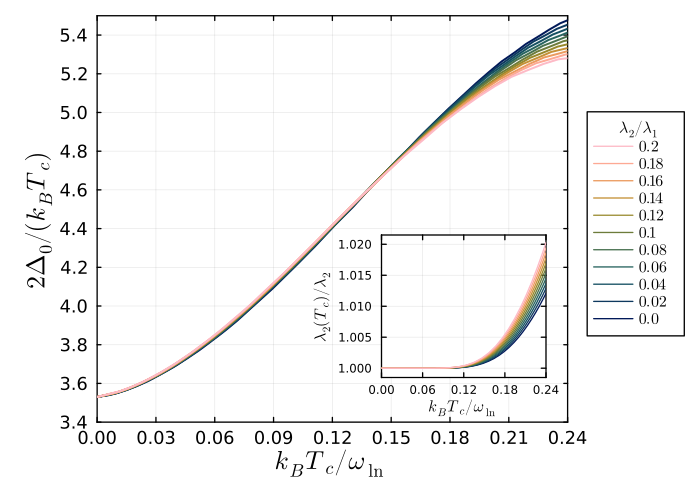

In [14]:
λ1 = 0.25:0.05:1
λ2 = 0:0.02:0.2
dλ = 0.1;   λ1high = 1+dλ:dλ:3.2
λtotplot = [λ1; λ1high]
#Tctot = [load_object("Tcs"); Tcplot]           placed in comments to not override the preloaded data
#Re_sol_high = Re_sol_λ_0                       placed in comments to not override the preloaded data

ℜΔl = real.(Re_sol_low[:,1,:,:]);
ωl = real.(Re_sol_low[1:end,4,1,1]);
ℜΔh = real.(Re_sol_high[:,1,:,:]);
ωh = real.(Re_sol_high[1:end,4,1,1]);
Tcs = Tctot[6:end,:];                           #starts at 6 because λ₁ = 0:0.05:0.25 give T_c = 0 anyways, for this reason we did not calculate Δ₀ there

D0l = findmin((ℜΔl .- ωl).^2, dims = 1)
D0h = findmin((ℜΔh .- ωh).^2, dims = 1)

Δ₀ = [ℜΔl[D0l[2]][1,:,:];   ℜΔh[D0h[2]][1,:,:]];

frac = abs.(2Δ₀./(kB*Tcs));

fullλ = [0.0001; 0.05:0.05:0.2; λtotplot]
ωln = zeros(size(Tctot,1),size(Tctot,2))
for i ∈ 1:size(ωln,1)
    for j ∈ 1:size(ωln,2)
        n_B = 1/(exp(ω₀/(kB*Tctot[i,j])) - 1)
        λtot = quadgk(x -> 2α²F(x, ω₀, fullλ[i], fullλ[i]*λ2[j]*(1+2*n_B), ϵ, ωcrit, zmin, zmax)/x,zmin,zmax,rtol=1e-5)[1]
        ωln[i,j] = exp(2/λtot*quadgk(x-> α²F(x, ω₀, fullλ[i], fullλ[i]*λ2[j]*(1+2*n_B), ϵ, ωcrit, zmin, zmax)*log(x)/x, zmin, zmax, rtol = 1e-5)[1])
    end
end
ωln
;

x = kB*Tcs./ωln[6:end,:]                        #another offset because the low values are not converged enough, the matrix dimension is too low (due to extremely low T_c)
λ2T = (1 .+ 1 ./ (exp.(ω₀./(kB.*Tcs))))
y = λ2T[:,:]

#We include the known result of convergence of the ration, 3.53, since the generated data suggests this value as well.

PLOT = plot([0; x[4:end,:]], [3.53; frac[4:end,:]], c = lcF, label = false, xlabel = L"k_BT_c/\omega_{\ln}", ylabel = L"2\Delta_0/(k_BT_c)",
    legendtitlefontsize = 8, thickness_scaling=1.33, size = (700,500), lw = 1.5, gridopacity = 0.05, xlabelfontsize = 13, ylabelfontsize = 13, yticks = 0:0.2:10, xticks = 0:0.03:1, xlims = (0,0.24), ylims = (3.4,5.5),
    xtickfontsize = 9, ytickfontsize = 9, framestyle = :box, ms = 1.5, msw = 0)

plot!([0; x], [1; y], c = lcF, label = false, xlabel = L"k_BT_c/\omega_{\ln}", ylabel = L"\lambda_2(T_c)/\lambda_2", lw = 1, gridopacity = 0.05, xlabelfontsize = 8, ylabelfontsize = 8, 
    xlims = (0,0.24), xticks = (0:0.06:0.24), yticks = 0.5:0.005:2, ylims = (0.9985,1.0215), xtickfontsize = 6, ytickfontsize = 6, framestyle = :box, ms = 0.1, inset = (bbox(0.545,0.47,0.235,0.285)), subplot = 2)

plot!(zeros(11,11),zeros(11,11), c = reverse(lcF), label = [L"%$j" for j = λ2[end:-1:1]'], legendposition = :outerright, legendtitle = L"\lambda_2/\lambda_1", subplot = 1)